In [ ]:
import pandas as pd

url='https://raw.githubusercontent.com/zrqxiangshuijiao/SocialGraph22/main/netflix_titles.csv'
# Getting the dataframe from the URL
df1 = pd.read_csv(url, sep=',' ,header=0, index_col=0)
# Only keeping the rows where 'cast' is not none
df = df1[df1['cast'].notna()]
# Transforming 'cast' to a list of strings
df.cast=df.cast.str[0:-1].str.split(',').tolist()
# Transforming 'listed_in'(genre) to a list of strings
df.listed_in=df.listed_in.str[0:-1].str.split(',').tolist()

# Removing the TV shows so only the Netflix movies remain
df = df[df['type'].str.contains('TV Show') == False]

/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [ ]:
# Loading the second dataset
df_b = pd.read_csv('https://raw.githubusercontent.com/zrqxiangshuijiao/SocialGraph22/main/ImdbTitleBasics.csv')
df_b = df_b[df_b['titleType'].str.contains('movie') == True]

# Loading the third dataset
url_r='https://raw.githubusercontent.com/zrqxiangshuijiao/SocialGraph22/main/ImdbTitleRatings.csv'
df_r = pd.read_csv(url_r, sep=',' ,header=0, index_col=0)

# Merging the two together
df_m = pd.merge(df_b, df_r, left_on = 'tconst', right_on = 'tconst', how = 'inner') 
df_m = df_m.drop_duplicates() 

# Removing irrelevant rows
df_m = df_m.drop(['tconst', 'titleType', 'originalTitle', 'isAdult', 'startYear', 'endYear', 'runtimeMinutes', 'genres'], axis=1)

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (5) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
df_b['titleType'].value_counts()

movie    230712
Name: titleType, dtype: int64

In [ ]:
len(df_m)

144689

In [ ]:
df_m['primaryTitle'].value_counts()

Mother                            20
Hamlet                            19
Desire                            16
Carmen                            16
The Three Musketeers              14
                                  ..
Free Admittance                    1
Poslednyaya doroga                 1
Population: 1                      1
Poltergeist II: The Other Side     1
Krocken                            1
Name: primaryTitle, Length: 132620, dtype: int64

In [ ]:
df.isna().sum()

type              0
title             0
director        134
cast              0
country         375
date_added        0
release_year      0
rating            2
duration          3
listed_in         0
description       0
dtype: int64

In [ ]:
df_m.isna().sum()

primaryTitle     0
averageRating    0
numVotes         0
dtype: int64

In [ ]:
# Merging with the netflix dataset
full_data_ = pd.merge(df, df_m, left_on = 'title', right_on = 'primaryTitle', how = 'inner') 

In [ ]:
# Only keeping the movies with more that 2000 votes
full_data = full_data_[full_data_.numVotes>2000]

In [ ]:
len(full_data)

872

# Basic Statistics


In [ ]:
full_data.isna().sum()

type             0
title            0
director         0
cast             0
country          9
date_added       0
release_year     0
rating           0
duration         0
listed_in        0
description      0
primaryTitle     0
averageRating    0
numVotes         0
dtype: int64

In [ ]:
full_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 872 entries, 1 to 2214
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   type           872 non-null    object 
 1   title          872 non-null    object 
 2   director       872 non-null    object 
 3   cast           872 non-null    object 
 4   country        863 non-null    object 
 5   date_added     872 non-null    object 
 6   release_year   872 non-null    int64  
 7   rating         872 non-null    object 
 8   duration       872 non-null    object 
 9   listed_in      872 non-null    object 
 10  description    872 non-null    object 
 11  primaryTitle   872 non-null    object 
 12  averageRating  872 non-null    float64
 13  numVotes       872 non-null    int64  
dtypes: float64(1), int64(2), object(11)
memory usage: 102.2+ KB


In [ ]:
print('Films: ' + str(len(full_data.title.unique())))
print('Countries: ' + str(len(full_data.country.unique())))
print('Ratings: ' + str(len(full_data)))

Films: 818
Countries: 149
Ratings: 872


In [ ]:
full_data.describe()

,release_year,averageRating,numVotes
count,872.000000,872.000000,8.720000e+02
mean,2002.449541,6.666858,1.119337e+05
std,12.633479,0.976975,1.973712e+05
min,1947.000000,2.500000,2.015000e+03
25%,1997.000000,6.000000,8.868250e+03
50%,2004.000000,6.700000,4.156200e+04
75%,2010.000000,7.400000,1.265998e+05
max,2021.000000,8.900000,1.846162e+06


In [ ]:
import altair as alt 
alt.data_transformers.enable('default', max_rows=None)
df["release_year"]=[str(i).translate({ord('-'): None,ord('('): None,ord(')'): None,ord('I'): None}) for i in df["release_year"]]
df.release_year=[i.lstrip() for i in df.release_year]
alt.Chart(df).mark_bar().encode(
    x="release_year:Q",
    y='count(release_year)',
    tooltip=['count(release_year)',"release_year"]
).properties(width=1000,height=350).configure_title(fontSize=14).configure(background="white").interactive()

alt.Chart(...)

Listings of movies and tv shows on Netflix that appear in the first dataset (df) were released between 1942 and 2021. 

We can see how most of them were released in the last 20 years. This doesn't mean that movies and tv shows are getting better over time, is has to do with the fact that more movies and tv shows were  produced in the last years.


In the folowing plot we corroborate that Movie Ranking is independent from the year that the movie are released

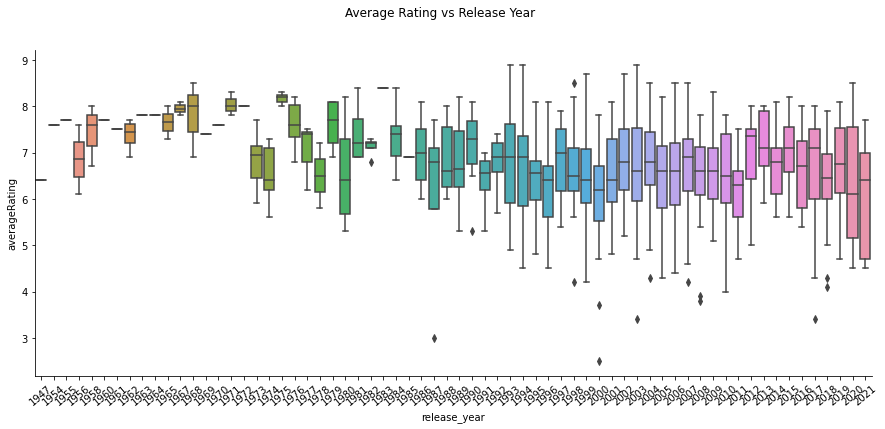

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
f, axs = plt.subplots( figsize=(15,6), facecolor="white")
sns.boxplot(x=full_data["release_year"].sort_values(ascending=True), y=full_data['averageRating'])
axs.tick_params(axis='x', rotation=40)
sns.despine()
plt.suptitle("Average Rating vs Release Year")
plt.show()

/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


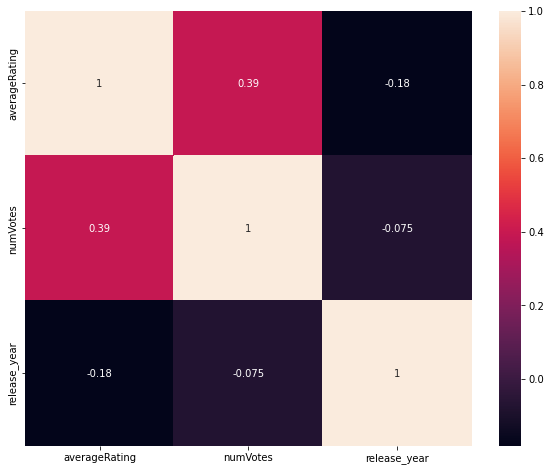

In [ ]:
full_data.release_year=full_data.release_year.astype('float64')
data_corr=full_data[['averageRating','numVotes','release_year']]
f, axs = plt.subplots(figsize=(10,8))
ax = sns.heatmap(data_corr.corr(), annot=True)

Most of variables are not very correlated to each other. The highest value is the one between 'Rating' and 'Votes' (0.39). This means that the more votes the film gets, the more highly rated it is. In a way, this can be understood like a lot of people have seen this movie, so, in general, it has been recommended a lot, so it is probably a good movie.

# Building the network

In [ ]:
from collections import defaultdict
d = defaultdict(dict)

# Building a dictionary
for i, row in full_data.iterrows():
    d[row.title] = row.drop(['title']).to_dict()
titles_all = dict(d)


In [ ]:
len(titles_all.keys())

818

In [ ]:
import networkx as nx

G = nx.DiGraph()
G.add_nodes_from(titles_all.keys()) # Defining the graph nodes

len(G.nodes())

818

In [ ]:
for title in titles_all:
  titles_all[title]['edges'] = []
  for actor in titles_all[title]['cast']:
    #check if actor appears in other movies 
    for title1 in titles_all:
      if actor in titles_all[title1]['cast'] and title1 != title:
        titles_all[title]['edges'].append(title1)  

In [ ]:
G = nx.DiGraph()
G.add_nodes_from(titles_all.keys()) # Defining the graph nodes

for each in titles_all:
    for link in titles_all[each]['edges']:
        G.add_edge(each,link) # Adding edges between the nodes

In [ ]:
print('The number of nodes in the network: {}'.format(len(G.nodes())))
print('The number of links in the network: {}'.format(len(G.edges())))

The number of nodes in the network: 818
The number of links in the network: 6488


In [ ]:
import numpy as np

def degree_distribution_in(G): # Function to get the in-degree distribution
    todict = dict(G.in_degree()) # Converting to dict in order to be able to extract the degrees from the different nodes.
    degs = list(todict.values()) # Extracting the degrees

    maxdeg = max(degs)
    mindeg = min(degs)
    
    kvalues= np.arange(0,maxdeg+1) # possible values of k
    count = np.zeros(maxdeg+1) # P(k)
    for k in degs:
        count[k] = count[k] + 1
    return kvalues,count

ks_in, count_in = degree_distribution_in(G)

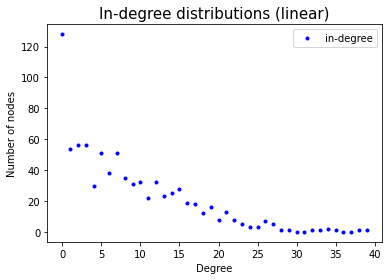

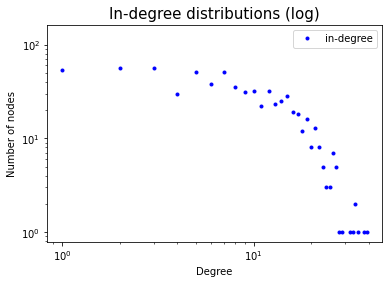

In [ ]:
import matplotlib.pyplot as plt

plt.figure()
plt.plot(ks_in,count_in,'b.', label='in-degree')
#plt.plot(ks_out, count_out, 'r.', label='out-degree')
plt.xlabel("Degree", fontsize=10)
plt.ylabel("Number of nodes", fontsize=10)
plt.title("In-degree distributions (linear)", fontsize=15)
plt.legend()

plt.figure()
plt.loglog(ks_in,count_in,'b.', label='in-degree')
#plt.loglog(ks_out, count_out, 'r.', label='out-degree')
plt.xlabel("Degree", fontsize=10)
plt.ylabel("Number of nodes", fontsize=10)
plt.title("In-degree distributions (log)", fontsize=15)
plt.legend()

In [ ]:
largest_cc = max(nx.weakly_connected_components(G), key=len)
G_cc = nx.subgraph(G, largest_cc)

print(len(G_cc.nodes()))
print(len(G_cc.edges()))

G_undirected = G_cc.to_undirected()

666
6446


In [ ]:
!pip install scipy --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


100%|██████████| 2000/2000 [00:24<00:00, 81.05it/s]


BarnesHut Approximation  took  6.49  seconds
Repulsion forces  took  15.28  seconds
Gravitational forces  took  0.12  seconds
Attraction forces  took  0.27  seconds
AdjustSpeedAndApplyForces step  took  0.67  seconds


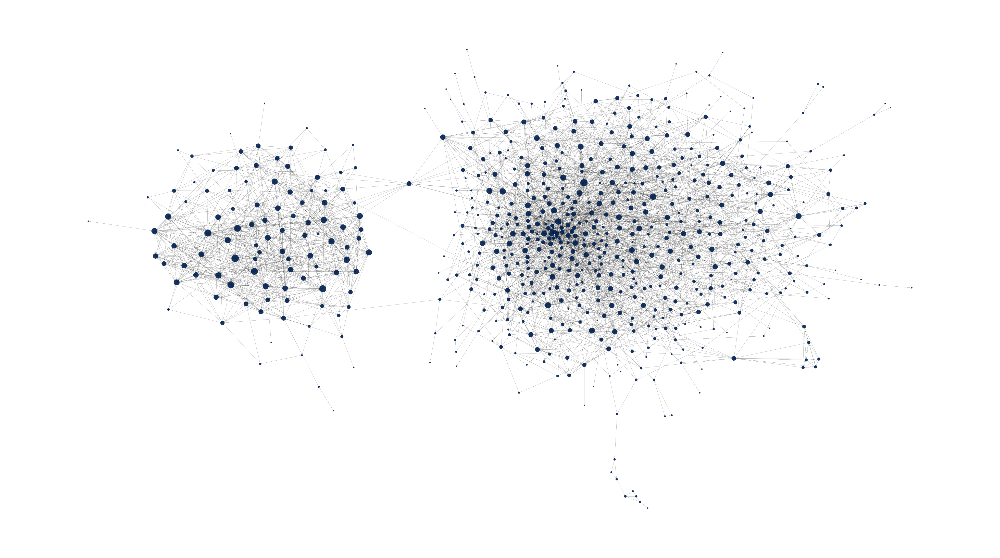

In [ ]:
import numpy as np
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,
                        linLogMode=False, 
                        adjustSizes=False,  
                        edgeWeightInfluence=1,
                        # Performance
                        jitterTolerance=1.0,
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,
                        multiThreaded=False, 
                        # Tuning
                        scalingRatio=0.1,
                        strongGravityMode=True,
                        gravity=5,
                        # Log
                        verbose=True)

positions = forceatlas2.forceatlas2_networkx_layout(network, pos=None, iterations=500)
plt.figure(figsize=(12, 12))

Colour_map = 'Paired'
values=list(partition.values())
maxval = np.max(values) 
cmap=plt.cm.Spectral
nx.draw(network,
        pos = positions,
        node_size=17, width=0.1,
        node_color = [cmap(v/maxval) for v in values]) # feed normalised group numbers directly into colormap)
for v in set(values):
    plt.scatter([],[], c=[cmap(v/maxval)], label='Community{}'.format(v))

plt.legend()
plt.show()

In [ ]:
from community import community_louvain
import networkx.algorithms.community as nx_comm

In [ ]:
net = [node for node in G_undirected]
#for node in G_undirected: # Iterating throung nodes in te entire undirected graph
#    net.append(node)

network_undirected = G_undirected.subgraph(net) # Creating subgraphs depending on the type
network_directed = G.subgraph(net)

largest_cc = max(nx.weakly_connected_components(network_directed), key=len)
network_cc = nx.subgraph(network_directed, largest_cc)

network = network_cc.to_undirected()

# Partitioning the Movie network to find communities within the Movie universe
partition = community_louvain.best_partition(network)  

In [ ]:
communities = {} # Dict containing all contents according to their value
for cont, val in partition.items():
    communities[val] = {}
    communities[val]['titles'] = []

for cont, val in partition.items():
    if val not in communities:#[val]['titles']: # The values that are not yet in the dict are added along with the content
      communities[val]['titles'] = [cont]
    else:
      communities[val]['titles'].append(cont) # For the values that are already present, the content is added to that value. 

In [ ]:
clist = []
for k, val in communities.items():
  #for title in communities[k]:#['titles']:
    #clist.append(title)
    clist.append(communities[k]['titles'])

modularity = nx_comm.modularity(network, clist) # Calculating modularity

In [ ]:
#clist = [val for cont,val in communities.items()] # List containing the different movies/TV shows in the comuunities

#modularity = nx_comm.modularity(network, clist) # Calculating modularity

In [ ]:
print('Modularity: ' + str(modularity))
print('Number of communities: ' + str(len(communities)))

count = 0
for k, vlist in communities.items():
    print('Number of nodes in community ' + str(k) + ': ' + str(len(communities[k]['titles'])))

Modularity: 0.5360917193738881
Number of communities: 10
Number of nodes in community 0: 105
Number of nodes in community 1: 53
Number of nodes in community 5: 101
Number of nodes in community 3: 79
Number of nodes in community 4: 105
Number of nodes in community 6: 64
Number of nodes in community 7: 33
Number of nodes in community 8: 78
Number of nodes in community 9: 9
Number of nodes in community 2: 39


100%|██████████| 500/500 [00:07<00:00, 67.10it/s]


BarnesHut Approximation  took  1.93  seconds
Repulsion forces  took  4.55  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.10  seconds
AdjustSpeedAndApplyForces step  took  0.27  seconds


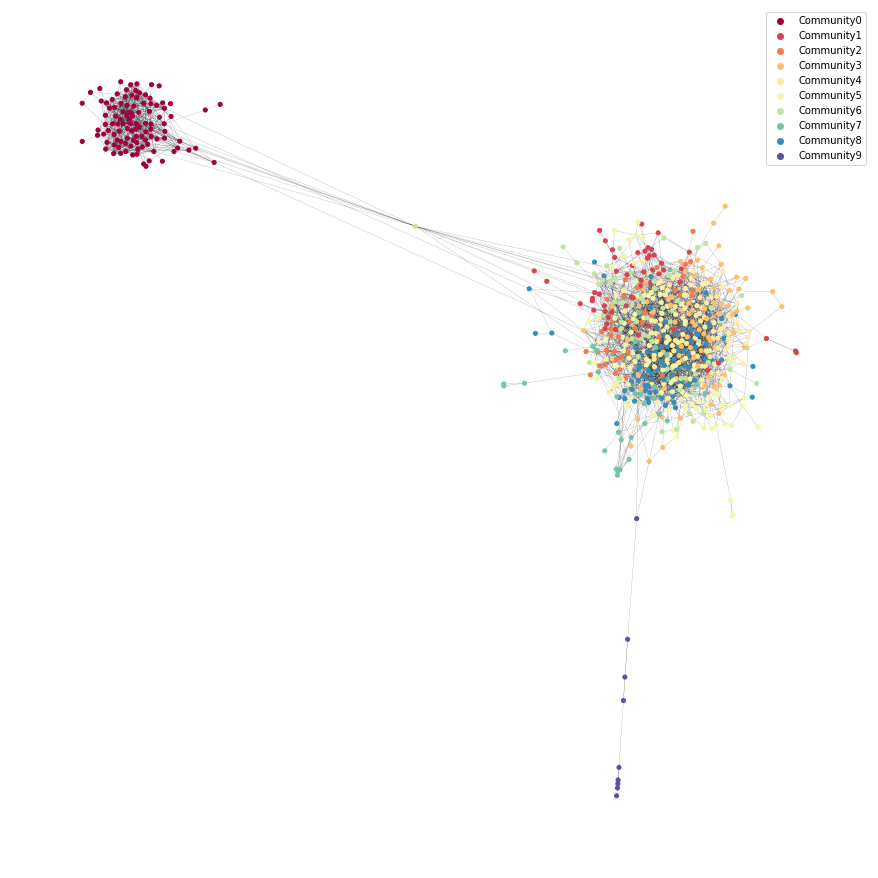

In [ ]:
import numpy as np
forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,
                        linLogMode=False, 
                        adjustSizes=False,  
                        edgeWeightInfluence=1,
                        # Performance
                        jitterTolerance=1.0,
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,
                        multiThreaded=False, 
                        # Tuning
                        scalingRatio=0.1,
                        strongGravityMode=True,
                        gravity=5,
                        # Log
                        verbose=True)

positions = forceatlas2.forceatlas2_networkx_layout(network, pos=None, iterations=500)
plt.figure(figsize=(12, 12))

Colour_map = 'Paired'
values=list(partition.values())
maxval = np.max(values) 
cmap=plt.cm.Spectral
nx.draw(network,
        pos = positions,
        node_size=17, width=0.1,
        node_color = [cmap(v/maxval) for v in values]) # feed normalised group numbers directly into colormap)
for v in set(values):
    plt.scatter([],[], c=[cmap(v/maxval)], label='Community{}'.format(v))

plt.legend()
plt.show()

# Country


In [ ]:
len_clist = [len(num) for num in clist]

len_clist.sort()
largest_values = len_clist[-10:]

ten_largest = {} # Making a new dict containing the ten largest communities
for val, cont_list in communities.items():
    if len(communities[val]['titles']) in largest_values:
        ten_largest['community '+ str(val)] = communities[val]['titles'] # val: list of contents

comms = {} # Dict containing communities as keys and the texts for the contents in the community as the values
for k, vlist in ten_largest.items():
  for name in vlist:
    text = titles_all[name]['country'] # country
    if k not in comms:
      comms[k] = [text]
    else:
      comms[k].append(text)

In [ ]:
# Only for countries
comms1 = {}
for value1 in comms.items():
  temp = []
  for value2 in value1[1]:
    if type(value2) == float:
      continue
  
    value3 = value2.split(', ')
    for value4 in value3:
      temp.append(value4)

  comms1[value1[0]] = temp


In [ ]:
import re
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')

for k, v in comms.items(): # comms is now a dictionary containing the community and the corresponding words
    #sl = [sublist for sublist in v] # Flattening list
    #jl = ' '.join(sl) # Converting to string
    word_tokens = word_tokenize(str(comms1))
    filtered_sentence = [w.lower() for w in word_tokens if len(w) > 1]
    jl1 = ' '.join(filtered_sentence)
    comms[k] = re.findall(r'\b[^\d\W]+\b', jl1) 

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
import math

word_count1 = {} # Dict containing term counts for each of the top-10 communities
for k in comms1.keys():
    word_count1[k] = {} # Nested dict   
    for word in comms1[k]:
        if word not in word_count1[k]:
            word_count1[k][word] = 1
        else:
            word_count1[k][word] += 1           
tf_lists = {} # Creating a dict containing the terms frequencies
for k, texts in comms1.items():
    tf_lists[k] = {}    
    for word, num in word_count1[k].items():
        tf_lists[k][word] = num/len(texts) # The term frequency is calculated
        
idf_lists = {}
com_count = {}
for k in word_count1.keys(): 
    for word in word_count1[k].keys():        
        if word not in com_count:
            com_count[word] = 1       
        else:
            com_count[word] += 1    

for k in tf_lists.keys():
    idf_lists[k] = {}    
    for word in word_count1[k].keys():
        idf_lists[k][word] = math.log(10/com_count[word])
        
tfidf = {}
for k in word_count1.keys():
    tfidf[k] = {}
    for name in word_count1[k].keys():
        tfidf[k][name] = (tf_lists[k][name]) * (idf_lists[k][name])

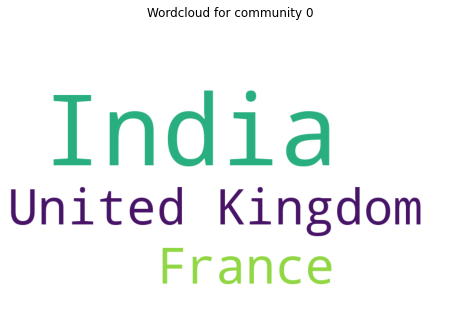

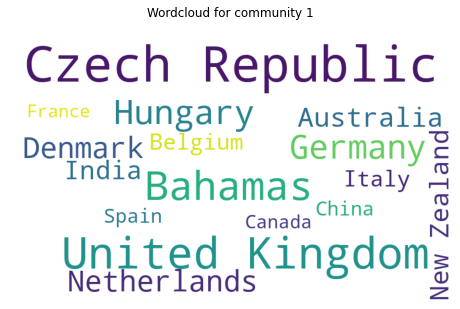

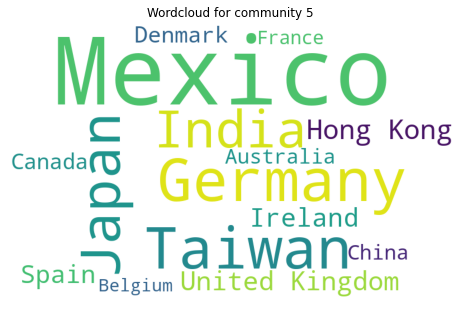

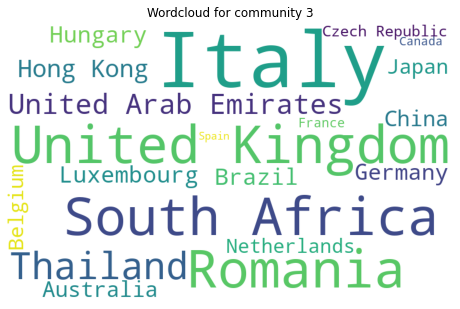

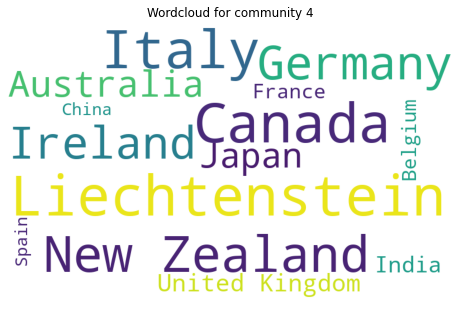

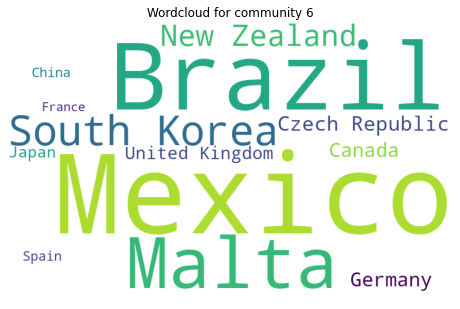

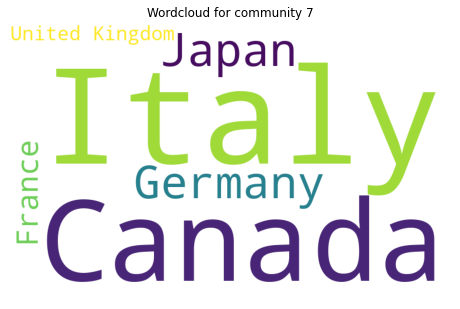

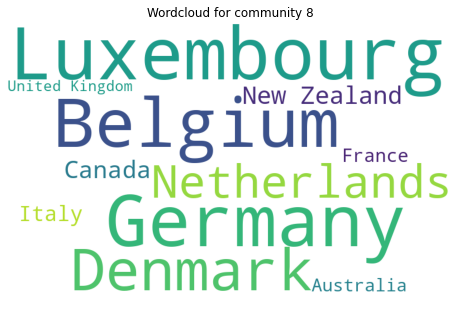

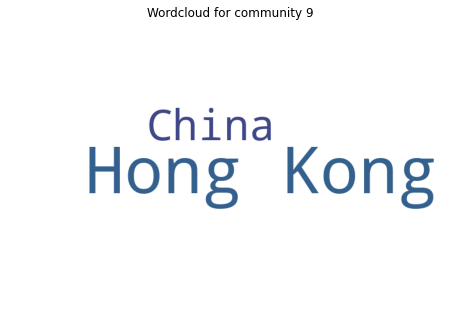

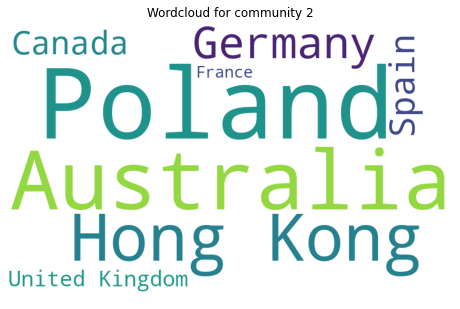

In [ ]:
from wordcloud import WordCloud


for k in tfidf.keys():
    w = WordCloud(width=800, height=500, mode='RGBA', background_color='white', 
                  max_words=1000).fit_words(dict(tfidf[k]))
    plt.figure(figsize=(8,6))
    plt.imshow(w)
    plt.title('Wordcloud for ' + k)
    plt.axis('off')
    plt.show()

# Description

In [ ]:
len_clist = [len(num) for num in clist]

len_clist.sort()
largest_values = len_clist[-10:]

ten_largest = {} # Making a new dict containing the ten largest communities
for val, cont_list in communities.items():
    if len(communities[val]['titles']) in largest_values:
        ten_largest['community '+ str(val)] = communities[val]['titles'] # val: list of contents

comms = {} # Dict containing communities as keys and the texts for the contents in the community as the values
for k, vlist in ten_largest.items():
  for name in vlist:
    text = titles_all[name]['description'] # country
    if k not in comms:
      comms[k] = [text]
    else:
      comms[k].append(text)

In [ ]:
import re
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')

for k, v in comms.items(): # comms is now a dictionary containing the community and the corresponding words
    sl = [sublist for sublist in v] # Flattening list
    jl = ' '.join(sl) # Converting to string
    word_tokens = word_tokenize(jl) 
    filtered_sentence = [w.lower() for w in word_tokens if len(w) > 1]
    jl1 = ' '.join(filtered_sentence)
    comms[k] = re.findall(r'\b[^\d\W]+\b', jl1) 

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
import math

word_count1 = {} # Dict containing term counts for each of the top-10 communities
for k in comms.keys():
    word_count1[k] = {} # Nested dict   
    for word in comms[k]:
        if word not in word_count1[k]:
            word_count1[k][word] = 1
        else:
            word_count1[k][word] += 1           
tf_lists = {} # Creating a dict containing the terms frequencies
for k, texts in comms.items():
    tf_lists[k] = {}    
    for word, num in word_count1[k].items():
        tf_lists[k][word] = num/len(texts) # The term frequency is calculated
        
idf_lists = {}
com_count = {}
for k in word_count1.keys(): 
    for word in word_count1[k].keys():        
        if word not in com_count:
            com_count[word] = 1       
        else:
            com_count[word] += 1    

for k in tf_lists.keys():
    idf_lists[k] = {}    
    for word in word_count1[k].keys():
        idf_lists[k][word] = math.log(10/com_count[word])
        
tfidf = {}
for k in word_count1.keys():
    tfidf[k] = {}
    for name in word_count1[k].keys():
        tfidf[k][name] = (tf_lists[k][name]) * (idf_lists[k][name])

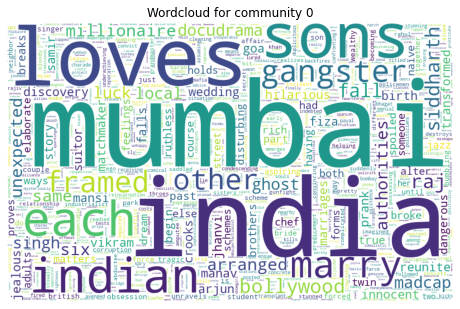

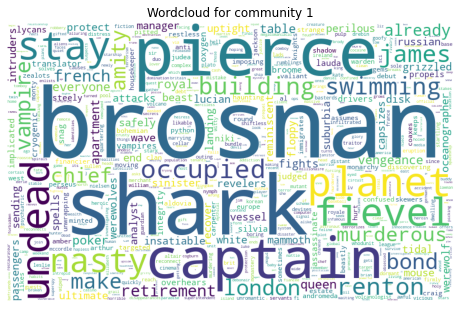

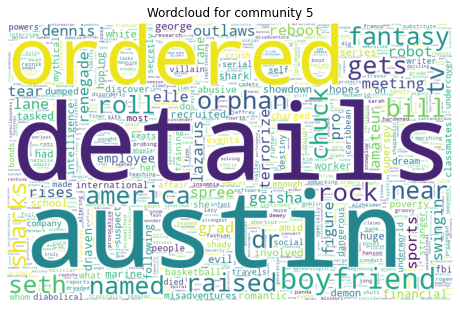

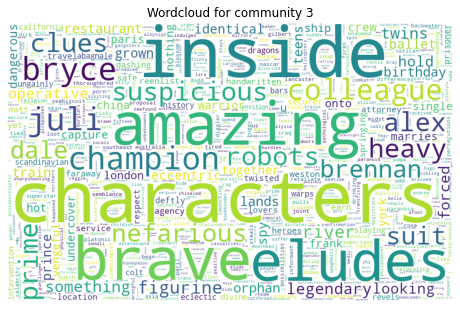

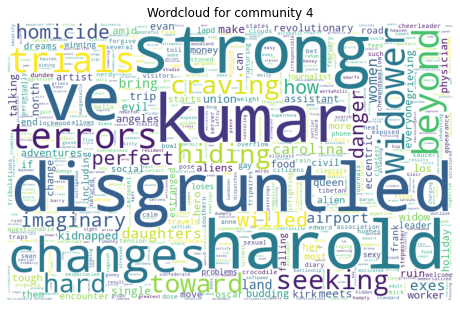

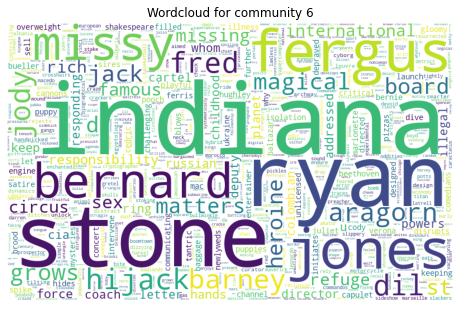

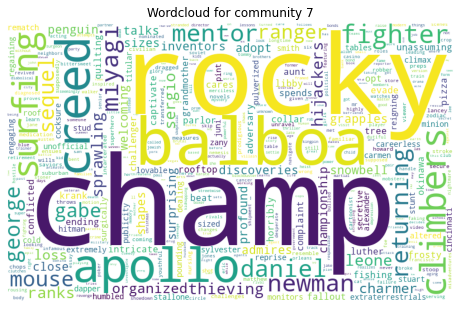

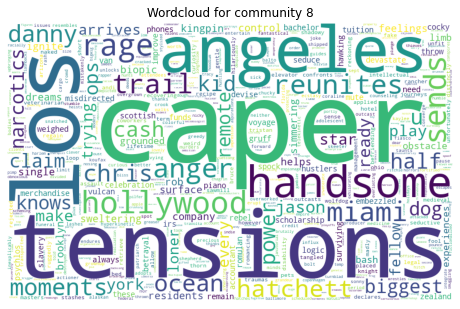

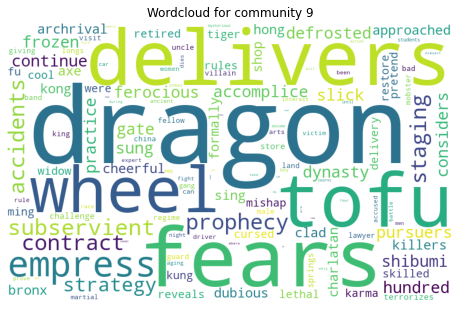

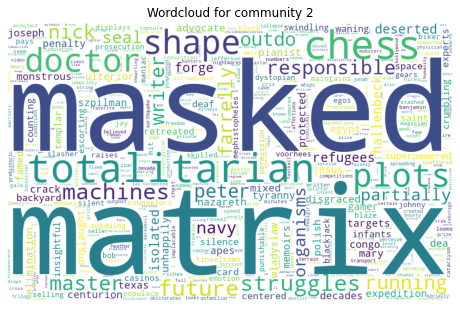

In [ ]:
from wordcloud import WordCloud


for k in tfidf.keys():
    w = WordCloud(width=800, height=500, mode='RGBA', background_color='white', 
                  max_words=1000).fit_words(dict(tfidf[k]))
    plt.figure(figsize=(8,6))
    plt.imshow(w)
    plt.title('Wordcloud for ' + k)
    plt.axis('off')
    plt.show()

# Average rating for each community

In [ ]:
# Want to extract the average rating for every movie in the community
# Then find the average and save it as an attribut in the communities-dictionary

In [ ]:
import numpy as np

for k, v in communities.items():
  communities[k]['avgRating'] = []

ratings = []
for k, v in communities.items():
  for title in communities[k]['titles']:
    ratings.append(titles_all[title]['averageRating'])
  avr = np.mean(ratings)
  communities[k]['avgRating'].append(avr)

In [ ]:
for k, v in communities.items():
  print('The average rating for community '+ str(k) + ' is: ' + str(communities[k]['avgRating']))

The average rating for community 0 is: [6.772380952380952]
The average rating for community 1 is: [6.773417721518986]
The average rating for community 5 is: [6.673359073359074]
The average rating for community 3 is: [6.689644970414203]
The average rating for community 4 is: [6.643115124153499]
The average rating for community 6 is: [6.656213017751479]
The average rating for community 7 is: [6.638703703703704]
The average rating for community 8 is: [6.628640776699029]
The average rating for community 9 is: [6.627272727272728]
The average rating for community 2 is: [6.628378378378378]


# Sentiment
here we calculate sentiment analysis using TextBlob library of python. 
Sentiment is calculated for:
1) the top 10 communities based on movie description
2) all observations present in the dataset
3)

In [ ]:
list_of_dict_values = list(ten_largest.values()) #getting titles for 10 top communities

In [ ]:
df1 = pd.DataFrame(data =list_of_dict_values) #creating dataset with top 10 communities titles

In [ ]:
df1.head(3)

,0,1,2,3,4,5,6,7,8,9,...,95,96,97,98,99,100,101,102,103,104
0,Jeans,Anjaam,Kyaa Kool Hai Hum,Shootout at Lokhandwala,Bombay,Roohi,Wazir,Awara Paagal Deewana,Apaharan,Gangaajal,...,Pardes,Raja Hindustani,Run,Sadma,Satte Pe Satta,Shiva,Socha Na Tha,Taal,The Parole Officer,Trimurti
1,Jaws,Jaws 2,Poseidon,Planet 51,The Net,The Strangers,Underworld,Underworld: Rise of the Lycans,The Interpreter,Layer Cake,...,None,None,None,None,None,None,None,None,None,None
2,Jaws: The Revenge,Bright Star,In the Cut,In Too Deep,Labyrinth,My Boss's Daughter,School of Rock,The Interview,Deep Blue Sea,Freedomland,...,The Dark Crystal,The Dukes of Hazzard,The Lives of Others,The Love Guru,The Mask of Zorro,Wyatt Earp,None,None,None,None


In [ ]:
df1_transposed = df1.T

In [ ]:
df1_transposed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105 entries, 0 to 104
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       105 non-null    object
 1   1       53 non-null     object
 2   2       101 non-null    object
 3   3       79 non-null     object
 4   4       105 non-null    object
 5   5       64 non-null     object
 6   6       33 non-null     object
 7   7       78 non-null     object
 8   8       9 non-null      object
 9   9       39 non-null     object
dtypes: object(10)
memory usage: 8.3+ KB


In [ ]:
df1_transposed.head(5) # columns are top 10 communities while rows are movie titles

,0,1,2,3,4,5,6,7,8,9
0,Jeans,Jaws,Jaws: The Revenge,Safe House,Training Day,Clear and Present Danger,Cliffhanger,Do the Right Thing,Initial D,Osmosis Jones
1,Anjaam,Jaws 2,Bright Star,Cold Mountain,A Cinderella Story,Letters to Juliet,Once Upon a Time in America,House Party,The Twins Effect II,Tears of the Sun
2,Kyaa Kool Hai Hum,Poseidon,In the Cut,Dear John,An Unfinished Life,The Guns of Navarone,My Girl,House Party 2,Accident,The Blue Lagoon
3,Shootout at Lokhandwala,Planet 51,In Too Deep,Mystery Men,Crocodile Dundee in Los Angeles,Heavy,My Girl 2,House Party 3,Dragon Tiger Gate,The Last Boy Scout
4,Bombay,The Net,Labyrinth,In the Line of Fire,Freedom Writers,Beethoven,Surf's Up,I Got the Hook Up,Iceman,Congo


In [ ]:
df1 = df1_transposed.stack().reset_index(drop=True)
df1 = df1.to_frame()

In [ ]:
df1 = df1.add_prefix('X_')

In [ ]:
df_sent = pd.merge(df, df1, left_on='title', right_on='X_0') #join main dataset with communities titles: df_sent only contains data regarding top 10 communities movies


In [ ]:
df.head(5)


,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
show_id,,,,,,,,,,,
s7,Movie,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha","[Vanessa Hudgens, Kimiko Glenn, James Marsde...",NaN,"September 24, 2021",2021,PG,91 min,[Children & Family Movie],Equestria's divided. But a bright-eyed hero be...
s8,Movie,Sankofa,Haile Gerima,"[Kofi Ghanaba, Oyafunmike Ogunlano, Alexandr...","United States, Ghana, Burkina Faso, United Kin...","September 24, 2021",1993,TV-MA,125 min,"[Dramas, Independent Movies, International M...","On a photo shoot in Ghana, an American model s..."
s10,Movie,The Starling,Theodore Melfi,"[Melissa McCarthy, Chris O'Dowd, Kevin Kline...",United States,"September 24, 2021",2021,PG-13,104 min,"[Comedies, Drama]",A woman adjusting to life after a loss contend...
s13,Movie,Je Suis Karl,Christian Schwochow,"[Luna Wedler, Jannis Niewöhner, Milan Pesche...","Germany, Czech Republic","September 23, 2021",2021,TV-MA,127 min,"[Dramas, International Movie]",After most of her family is murdered in a terr...
s14,Movie,Confessions of an Invisible Girl,Bruno Garotti,"[Klara Castanho, Lucca Picon, Júlia Gomes, ...",NaN,"September 22, 2021",2021,TV-PG,91 min,"[Children & Family Movies, Comedie]",When the clever but socially-awkward Tetê join...


In [ ]:
%matplotlib inline
import plotly.express as px


df1=df_sent[['type','release_year']]
df1=df1.rename(columns={"release_year": "Release Year"})
df2=df1.groupby(['Release Year','type']).size().reset_index(name='Total Content')
df2=df2[df2['Release Year'].astype(int)>=1970]
fig3 = px.line(df2, x="Release Year", y="Total Content", color='type',title='Trend of content produced over the years on Netflix for top 10 communities')
fig3.show()

In [ ]:
#calculate content sentiment for top 10 communities 
from textblob import TextBlob

dfx=df_sent[['release_year','description']]
dfx=dfx.rename(columns={'release_year':'Release Year'})
for index,row in dfx.iterrows():
    z=row['description']
    testimonial=TextBlob(z)
    p=testimonial.sentiment.polarity
    if p==0:
        sent='Neutral'
    elif p>0:
        sent='Positive'
    else:
        sent='Negative'
    dfx.loc[[index,2],'Sentiment']=sent


dfx=dfx.groupby(['Release Year','Sentiment']).size().reset_index(name='Total Content')

dfx=dfx[dfx['Release Year'].astype(int)>=2010]

[Text(0.5, 1.0, 'Top 10 communities content sentiment')]

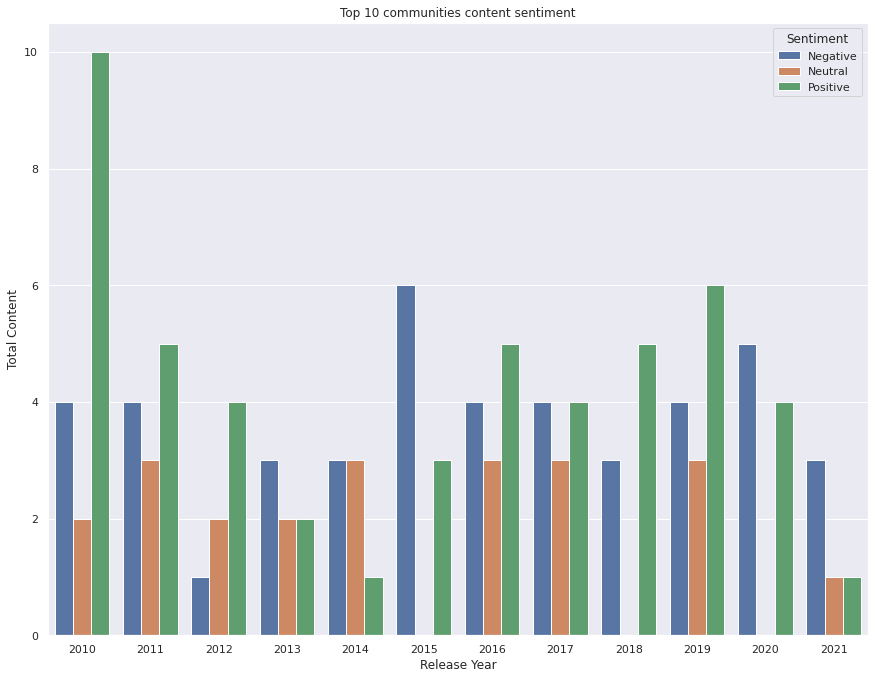

In [ ]:
#dfx.plot(kind='bar', figsize=(12,12), title='Nexflix Content Sentiment of top 10 communities', x='Release Year',y='Total Content', color='Sentiment', xlabel='Release Year', ylabel='Number of cases')
import seaborn as sns
a4_dims = (14.7, 11.27)
sns.set()
fig, ax = plt.subplots(figsize=a4_dims)
sns.barplot(data=dfx, x="Release Year", y="Total Content", hue="Sentiment", ax = ax).set(title='Top 10 communities content sentiment')

In [ ]:
dfx=df_sent[['release_year','description']]
dfx=dfx.rename(columns={'release_year':'Release Year'})
for index,row in dfx.iterrows():
    z=row['description']
    testimonial=TextBlob(z)
    p=testimonial.sentiment.polarity
    if p==0:
        sent='Neutral'
    elif p>0:
        sent='Positive'
    else:
        sent='Negative'
    dfx.loc[[index,2],'Sentiment']=sent


dfx=dfx.groupby(['Release Year','Sentiment']).size().reset_index(name='Total Content')

dfx=dfx[dfx['Release Year'].astype(int)>=2010]

[Text(0.5, 1.0, 'Netflix content sentiment')]

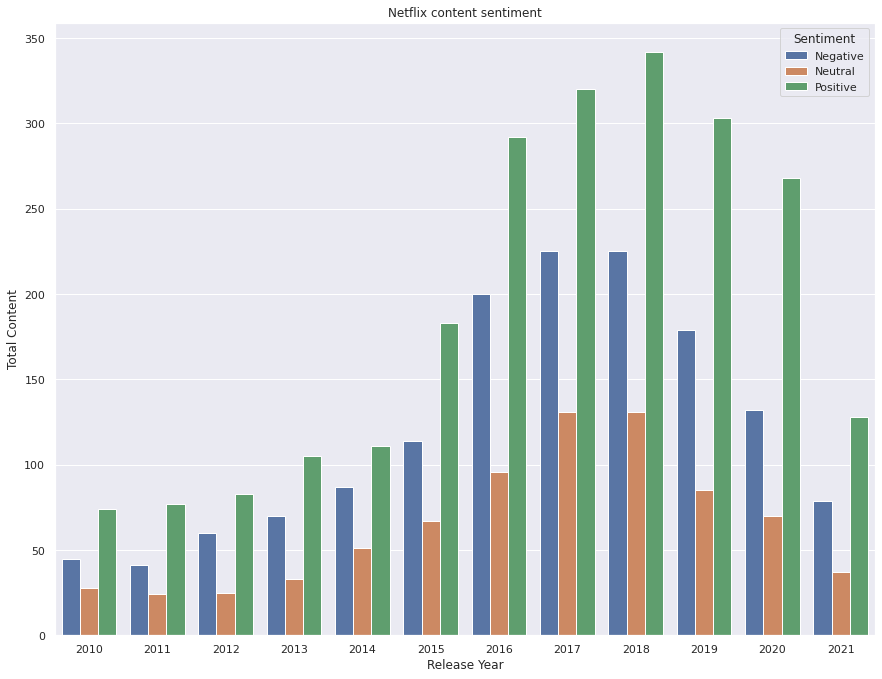

In [ ]:
#Calculate all Netflix content sentiment 
df = df.reset_index()
dfx1=df[['release_year','description']]
dfx1=dfx1.rename(columns={'release_year':'Release Year'})
for index,row in dfx1.iterrows():
    z=row['description']
    testimonial=TextBlob(z)
    p=testimonial.sentiment.polarity
    if p==0:
        sent='Neutral'
    elif p>0:
        sent='Positive'
    else:
        sent='Negative'
    dfx1.loc[[index,2],'Sentiment']=sent


dfx1=dfx1.groupby(['Release Year','Sentiment']).size().reset_index(name='Total Content')

dfx1=dfx1[dfx1['Release Year'].astype(int)>=2010]

a4_dims = (14.7, 11.27)
sns.set()
fig, ax = plt.subplots(figsize=a4_dims)
sns.barplot(data=dfx1, x="Release Year", y="Total Content", hue="Sentiment", ax = ax).set(title='Netflix content sentiment')

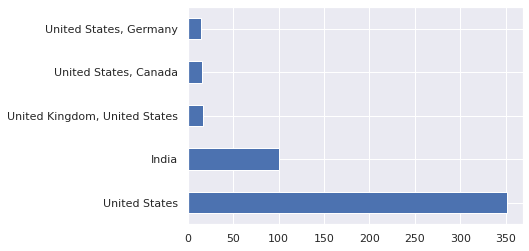

In [ ]:
df_sent['country'].value_counts()[:5].plot(kind='barh') #top 5 countries in top 10 communities

In [ ]:
#selecting content for only top 5 countries from top 10 communities
df_country = df_sent.loc[(df_sent['country'] == 'United States') | (df_sent['country'] == 'India') | (df_sent['country'] == 'United States, Germany') | (df_sent['country'] == 'United States, Canada') | (df_sent['country'] == 'United Kingdom, United States')                          ]

[Text(0.5, 1.0, 'Netflix content sentiment by top 5 Countries in top 10 communities')]

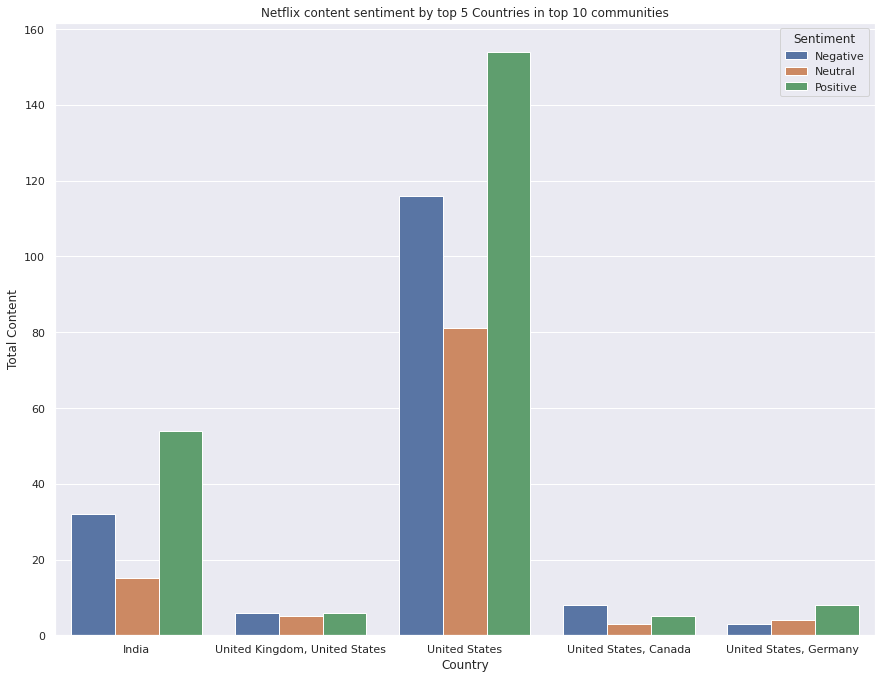

In [ ]:
dfx2=df_country[['country','description']]
dfx2=dfx2.rename(columns={'country':'Country'})
for index,row in dfx2.iterrows():
    z=row['description']
    testimonial=TextBlob(z)
    p=testimonial.sentiment.polarity
    if p==0:
        sent='Neutral'
    elif p>0:
        sent='Positive'
    else:
        sent='Negative'
    dfx2.loc[[index,2],'Sentiment']=sent


dfx2=dfx2.groupby(['Country','Sentiment']).size().reset_index(name='Total Content')



a4_dims = (14.7, 11.27)
sns.set()
fig, ax = plt.subplots(figsize=a4_dims)
sns.barplot(data=dfx2, x="Country", y="Total Content", hue="Sentiment", ax = ax).set(title='Netflix content sentiment by top 5 Countries in top 10 communities')

In [ ]:
df_tot_country = df.loc[(df['country'] == 'United States') | (df['country'] == 'India') | (df['country'] == 'United States, Germany') | (df['country'] == 'United States, Canada') | (df['country'] == 'United Kingdom, United States')                          ]

[Text(0.5, 1.0, 'Netflix content sentiment by top 5 Countries ')]

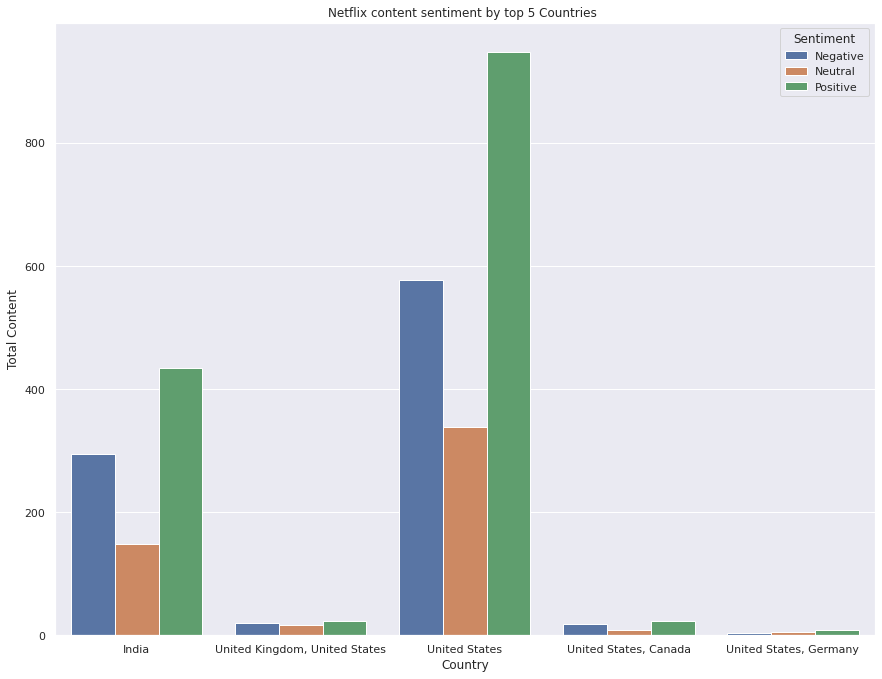

In [ ]:
dfx4=df_tot_country[['country','description']]
dfx4=dfx4.rename(columns={'country':'Country'})
for index,row in dfx4.iterrows():
    z=row['description']
    testimonial=TextBlob(z)
    p=testimonial.sentiment.polarity
    if p==0:
        sent='Neutral'
    elif p>0:
        sent='Positive'
    else:
        sent='Negative'
    dfx4.loc[[index,2],'Sentiment']=sent


dfx4=dfx4.groupby(['Country','Sentiment']).size().reset_index(name='Total Content')



a4_dims = (14.7, 11.27)
sns.set()
fig, ax = plt.subplots(figsize=a4_dims)
sns.barplot(data=dfx4, x="Country", y="Total Content", hue="Sentiment", ax = ax).set(title='Netflix content sentiment by top 5 Countries ')

In [ ]:
df1_transposed.columns =['Comm1', 'Comm2', 'Comm3', 'Comm4', 'Comm5','Comm6', 'Comm7', 'Comm8', 'Comm9', 'Comm10']


In [ ]:
def sentiment_analysis(dataframe):
    
    dfx_comm = dataframe
    polarity = 0
    positive = 0
    negative = 0
    neg= 0
    pos = 0
    for index,row in dfx_comm.iterrows():
         z=row['description']
         testimonial=TextBlob(z)
         p=testimonial.sentiment.polarity


         if p==0:
               sent='Neutral'
         elif p>0:
               sent='Positive'
               positive +=1
               pos += p
         else:
               sent='Negative'
               negative +=1
               neg += p

         dfx_comm.loc[[index],'Sentiment']=sent
         polarity += p
    
    pos_mean = pos/positive
    neg_mean = neg/negative

    
    dfx_comm= dfx_comm.groupby(['Sentiment']).size().reset_index(name='Cases') 

    return dfx_comm, polarity/len(dataframe), pos_mean, neg_mean


In [ ]:
data=[]


for i in range(1,11):
  community_name = f"Comm{i}"
  
  community_df = pd.merge(df, df1_transposed, left_on='title', right_on=community_name, how="outer",indicator=True,) 
  community_df = community_df[[community_name,'description']]
  community_df = community_df.dropna()
  community_df.reset_index(drop=True, inplace=True)
  
  sentiment_df, polarity, pos_mean, neg_mean = sentiment_analysis(community_df)

  
  d = {row.Sentiment:row.Cases for idc,row in sentiment_df.iterrows()}
  d["Sentiment Ratio"] = polarity
  d["Positive Mean"] = pos_mean
  d["Negative Mean"] = neg_mean 
  data.append(d)
  
sentiment_df=pd.DataFrame(data)
sentiment_df

,Negative,Neutral,Positive,Sentiment Ratio,Positive Mean,Negative Mean
0,34,15,56,0.064943,0.249648,-0.210625
1,24,12,17,-0.024754,0.225746,-0.214569
2,38,16,47,0.018826,0.223957,-0.226963
3,31,12,36,0.047788,0.283549,-0.207501
4,25,31,49,0.073674,0.254717,-0.189813
5,18,18,28,0.048501,0.281652,-0.265678
6,14,5,14,-0.023420,0.192201,-0.247406
7,23,14,41,0.077139,0.236511,-0.160005
8,1,4,4,0.069213,0.274479,-0.475000
9,12,11,16,0.058369,0.276512,-0.178983


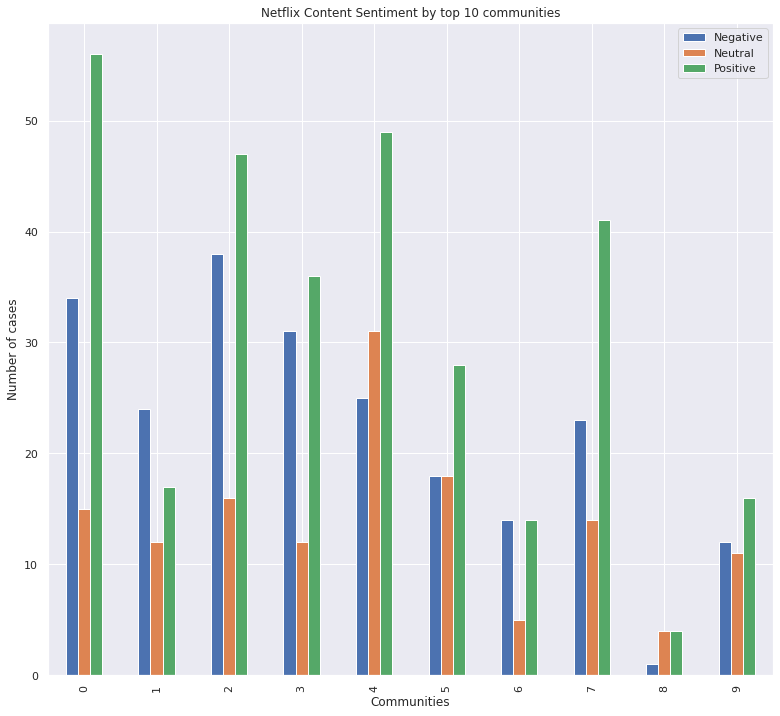

In [ ]:
Cases = sentiment_df[['Negative','Neutral','Positive']]
Cases.plot(kind='bar', figsize=(13,12), title='Netflix Content Sentiment by top 10 communities', xlabel='Communities', ylabel='Number of cases')

In [ ]:
Ratio = sentiment_df['Sentiment Ratio']

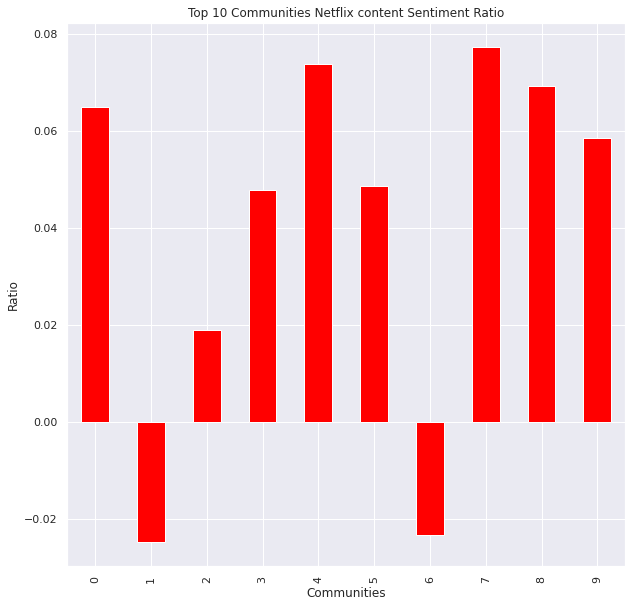

In [ ]:
Ratio.plot(kind='bar', figsize=(10,10), title='Top 10 Communities Netflix content Sentiment Ratio', xlabel='Communities', ylabel='Ratio', colormap='autumn')


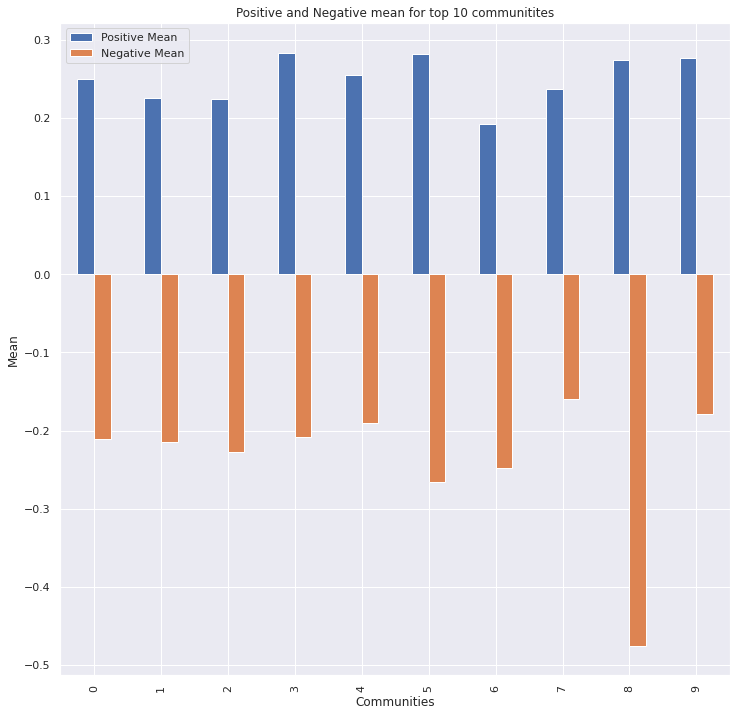

In [ ]:
Mean = sentiment_df[['Positive Mean','Negative Mean']]
Mean.plot(kind='bar', figsize=(12,12), title='Positive and Negative mean for top 10 communitites', xlabel='Communities', ylabel='Mean')

In [ ]:
df_sent.head(5)

,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,X_0
0,Movie,Jeans,S. Shankar,"[Prashanth, Aishwarya Rai Bachchan, Sri Laks...",India,"September 21, 2021",1998,TV-14,166 min,"[Comedies, International Movies, Romantic Mo...",When the father of the man she loves insists t...,Jeans
1,Movie,Jaws,Steven Spielberg,"[Roy Scheider, Robert Shaw, Richard Dreyfuss...",United States,"September 16, 2021",1975,PG,124 min,"[Action & Adventure, Classic Movies, Drama]",When an insatiable great white shark terrorize...,Jaws
2,Movie,Jaws 2,Jeannot Szwarc,"[Roy Scheider, Lorraine Gary, Murray Hamilto...",United States,"September 16, 2021",1978,PG,116 min,"[Dramas, Horror Movies, Thriller]",Four years after the last deadly shark attacks...,Jaws 2
3,Movie,Jaws: The Revenge,Joseph Sargent,"[Lorraine Gary, Lance Guest, Mario Van Peebl...",United States,"September 16, 2021",1987,PG-13,91 min,"[Action & Adventure, Horror Movies, Thriller]","After another deadly shark attack, Ellen Brody...",Jaws: The Revenge
4,Movie,Safe House,Daniel Espinosa,"[Denzel Washington, Ryan Reynolds, Vera Farm...","South Africa, United States, Japan","September 16, 2021",2012,R,115 min,[Action & Adventur],Young CIA operative Matt Weston must get a dan...,Safe House


In [ ]:
p=df_sent.groupby(['rating']).size().reset_index(name='counts')
piechart=px.pie(p,values='counts',names='rating',title='Content Rating for top 10 communities')
piechart.show()

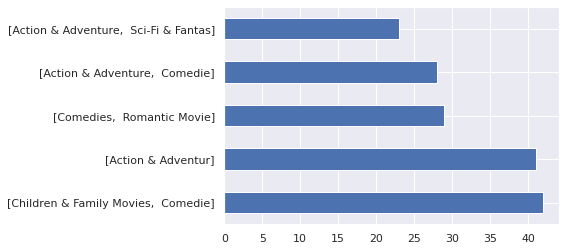

In [ ]:
df_sent['listed_in'].value_counts()[:5].plot(kind='barh')

In [ ]:
df_imdb =pd.read_csv("https://raw.githubusercontent.com/zrqxiangshuijiao/SocialGraph22/main/ImdbRevenues.csv",encoding = "ISO-8859-1")

In [ ]:
df_imdb.head(5)

,Rank,Title,Year,Score,Metascore,Genre,Vote,Director,Runtime,Revenue,Description
0,1,The Shawshank Redemption,1994,9.3,80.0,Drama,2011509,Frank Darabont,142,28.34,Two imprisoned men bond over a number of years...
1,2,The Dark Knight,2008,9.0,84.0,"Action, Crime, Drama",1980200,Christopher Nolan,152,534.86,When the menace known as the Joker emerges fro...
2,3,Inception,2010,8.8,74.0,"Action, Adventure, Sci-Fi",1760209,Christopher Nolan,148,292.58,A thief who steals corporate secrets through t...
3,4,Fight Club,1999,8.8,66.0,Drama,1609459,David Fincher,139,37.03,An insomniac office worker and a devil-may-car...
4,5,Pulp Fiction,1994,8.9,94.0,"Crime, Drama",1570194,Quentin Tarantino,154,107.93,"The lives of two mob hitmen, a boxer, a gangst..."


In [ ]:
df_imdb.describe()

,Rank,Year,Score,Metascore,Vote,Runtime,Revenue
count,10000.00000,10000.000000,10000.000000,6781.000000,1.000000e+04,10000.000000,7473.000000
mean,5000.50000,1998.116200,6.627530,56.534140,6.448852e+04,108.696900,36.263402
std,2886.89568,18.249608,1.041204,17.965689,1.249423e+05,21.659929,60.882025
min,1.00000,1915.000000,1.300000,10.000000,6.015000e+03,45.000000,0.000000
25%,2500.75000,1991.000000,6.000000,44.000000,1.014725e+04,94.000000,1.890000
50%,5000.50000,2004.000000,6.700000,57.000000,2.117250e+04,105.000000,15.090000
75%,7500.25000,2011.000000,7.400000,70.000000,6.205200e+04,118.000000,43.860000
max,10000.00000,2018.000000,9.600000,99.000000,2.011509e+06,450.000000,936.660000


In [ ]:
df_rev = pd.merge(df_sent, df_imdb, left_on='title', right_on='Title') #join community dataset with imdb reveniew and votes dataset, some data gets lost, total 1334 movies are present

In [ ]:
df_rev.head(2)

,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,...,Title,Year,Score,Metascore,Genre,Vote,Director,Runtime,Revenue,Description
0,Movie,Jaws,Steven Spielberg,"[Roy Scheider, Robert Shaw, Richard Dreyfuss...",United States,"September 16, 2021",1975,PG,124 min,"[Action & Adventure, Classic Movies, Drama]",...,Jaws,1975,8.0,87.0,"Adventure, Drama, Thriller",493026,Steven Spielberg,124,260.00,When a killer shark unleashes chaos on a beach...
1,Movie,Jaws 2,Jeannot Szwarc,"[Roy Scheider, Lorraine Gary, Murray Hamilto...",United States,"September 16, 2021",1978,PG,116 min,"[Dramas, Horror Movies, Thriller]",...,Jaws 2,1978,5.7,51.0,"Adventure, Drama, Horror",61192,Jeannot Szwarc,116,102.92,Police chief Brody must protect the citizens o...


In [ ]:
df_rev.describe()

,Rank,Year,Score,Metascore,Vote,Runtime,Revenue
count,608.000000,608.000000,608.000000,496.000000,6.080000e+02,608.000000,555.000000
mean,2970.588816,1999.292763,6.656579,55.625000,1.304571e+05,114.527961,59.764468
std,2462.768424,12.713410,0.973211,17.729292,1.855534e+05,24.458738,58.246772
min,5.000000,1925.000000,2.400000,15.000000,6.069000e+03,64.000000,0.010000
25%,1046.000000,1995.000000,6.000000,42.000000,2.659800e+04,97.000000,16.575000
50%,2262.000000,2003.000000,6.700000,55.000000,6.987650e+04,109.000000,40.580000
75%,4416.500000,2007.000000,7.400000,68.000000,1.539935e+05,125.000000,85.205000
max,9947.000000,2017.000000,8.900000,98.000000,1.570194e+06,229.000000,377.850000


In [ ]:
# top 10 communties Netflix content generated a mean of 59.8 million dollars and have a mean score of 6.65 (min 0 max 10)

 ## Results
 1) differences between all Netflix content sentiment and top 10 communities sentiment by year
 
 2) differences between Top 10 communities sentiment for top 5 countries with total netflix content top 5 countries


3)comparison between top 10 communities based on sentiment ratio



4) comparison between top 10 communities positive and negative means



5)comparison between top 10 communities total revenues with netflix revenues

6) content top 10 communities Rating


7) comparison between top 10 communities scores and total scores
